In [115]:
import os
import numpy as np
import nibabel as nib
import matplotlib.pylab as plt

In [116]:
np.set_printoptions(threshold=np.inf)

In [117]:
# Structure of data

'''
BraTS
|- BraTS2021_Training_Data
    |- BraTS2021_xxxxx
        |- BraTS2021_xxxxx_flair.nii.gz
        |- BraTS2021_xxxxx_t1.nii.gz
        |- BraTS2021_xxxxx_t1ce.nii.gz
        |- BraTS2021_xxxxx_t2.nii.gz
        |- BraTS2021_xxxxx_seg.nii.gz
'''

'\nBraTS\n|- BraTS2021_Training_Data\n    |- BraTS2021_xxxxx\n        |- BraTS2021_xxxxx_flair.nii.gz\n        |- BraTS2021_xxxxx_t1.nii.gz\n        |- BraTS2021_xxxxx_t1ce.nii.gz\n        |- BraTS2021_xxxxx_t2.nii.gz\n        |- BraTS2021_xxxxx_seg.nii.gz\n'

# List all folders

In [118]:
main_path = './BraTS/BraTS2021_Training_Data/'
scans = os.listdir(main_path)
if '.DS_Store' in scans:
  scans.remove('.DS_Store')

# Some images

In [268]:
np.random.seed(42)
rand_scan = np.random.choice(scans, 1)[0]

In [264]:
import sklearn
from sklearn.preprocessing import MinMaxScaler as scaler

img = nib.load(main_path + rand_scan + "/" + rand_scan + '_t1ce.nii.gz').get_fdata()
print(img.shape, np.max(img), np.min(img))


(240, 240, 155) 13204.0 0.0


In [ ]:
rand_scan
print(rand_scan)
print(img.shape)
x = img.reshape(-1, img.shape[-1])
print(x.shape)
img=scaler.fit_transform(x).reshape(img.shape)



In [229]:
155/2

77.5

In [218]:
def find_boundaries(scan):
    nonzero = np.nonzero(scan)
    return [(min(b), max(b)+1) for b in nonzero]


boundaries = [(69, 134), (53, 129), (54, 103)]

#NO
#new_img = img[  53:129, 54:103, 69:134]
#new_img = img[   54:103, 69:134, 53:129]
#new_img = img[ 69:134, 53:129, 54:103]





In [292]:
#BOTTOM TO TOP
start_of_image_y=[]
for i in range(0,240):
    counter = 0 
    for j in range(0,240):
        if img[j,i,77] == 0:
            counter = counter + 1
    if counter != 240:
        start_of_image_y.append(i)

#LEFT TO RIGHT
start_of_image_x=[]
for i in range(0,240):
    counter = 0 
    for j in range(0,240):
        if img[i,j,77] == 0:
            counter = counter + 1
    if counter != 240:
        start_of_image_x.append(i)


end_of_image_y = start_of_image_y[len(start_of_image_y)-1]
end_of_image_x = start_of_image_x[len(start_of_image_x)-1]

print(start_of_image_y[0],end_of_image_y)
print(start_of_image_x[0],end_of_image_x)

36 208
55 186


In [265]:
import cv2
def crop(img):
    return cv2.boundingRect(cv2.findNonZero(img[:,:,77]))
crop(img)

(36, 55, 173, 132)

(240, 240, 155)


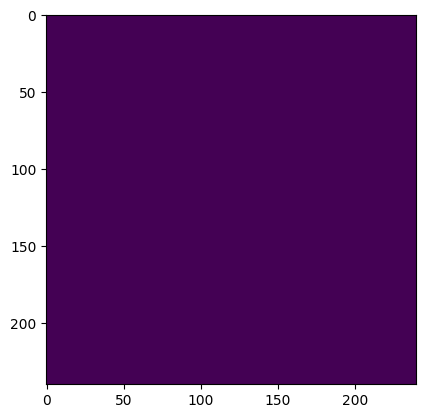

In [311]:
new_img = img[ :,:,:]
print(new_img.shape)

plt.imshow(new_img[:,:,2])
plt.show()

(31, 51, 178, 139)

(240, 240, 155)


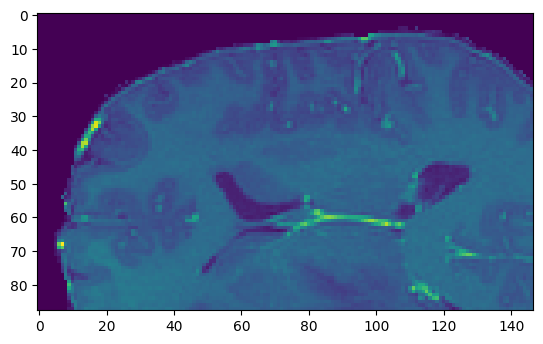

In [266]:
new_img = img[ :,:,:]
print(new_img.shape)

plt.imshow(new_img[51:139,31:178,77])
plt.show()

(240, 240, 155)


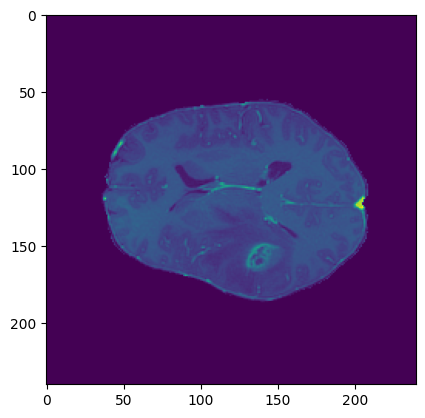

In [267]:
new_img = img[ :,:,:]
print(new_img.shape)

plt.imshow(new_img[:,:,77])
plt.show()

(240, 240, 155)


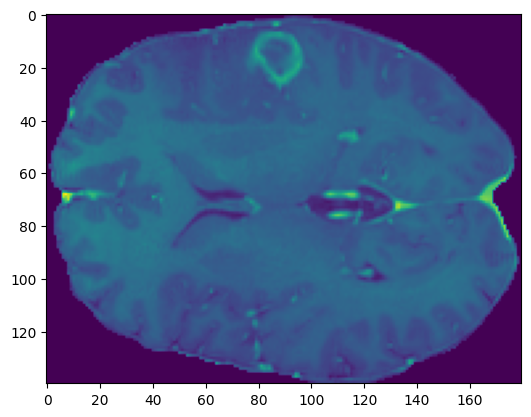

In [240]:

new_img = img[ :,:,:]
print(new_img.shape)

plt.imshow(new_img[50:190,30:210,77])
plt.show()

(240, 240, 155)


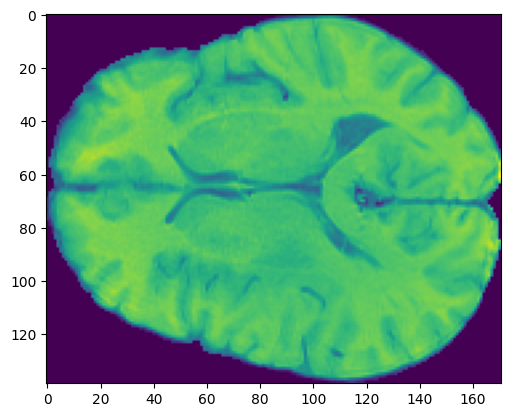

In [322]:
new_img = img[ :,:,:]
print(new_img.shape)

plt.imshow(new_img[53:192,36:207,77])
plt.show()

In [122]:
curr_x_min, curr_y_min, curr_z_min = 1000,1000,1000
curr_x_max, curr_y_max, curr_z_max = 0,0,0

for i, scan in enumerate(scans):
    img = nib.load(main_path + scan + "/" + scan + '_t1.nii.gz').get_fdata()
    boundaries = find_boundaries(img)
    x_min, x_max = min(x[0]), max(x[0])
    if x_min < curr_x_min:
        curr_x_min = x_min
    if x_max > curr_x_max:
        curr_x_max = x_max

    y_min, y_max = min(x[1]), max(x[1])
    if y_min < curr_y_min:
        curr_y_min = y_min
    if y_max > curr_y_max:
        curr_y_max = y_max

    z_min, z_max = min(x[2]), max(x[2])   
    if z_min < curr_z_min:
        curr_z_min = z_min
    if z_max > curr_z_max:
        curr_z_max = z_max
    print("SCAN NUMBER", i, "OUT OF", len(scans))
print("The values for x are (",curr_x_min, curr_x_max, "). The values for y are (",curr_y_min, curr_y_max,"). The values for z are (", curr_z_min, curr_z_max,").")
    

SCAN NUMBER 0 OUT OF 1251
SCAN NUMBER 1 OUT OF 1251
SCAN NUMBER 2 OUT OF 1251
SCAN NUMBER 3 OUT OF 1251
SCAN NUMBER 4 OUT OF 1251
SCAN NUMBER 5 OUT OF 1251
SCAN NUMBER 6 OUT OF 1251
SCAN NUMBER 7 OUT OF 1251
SCAN NUMBER 8 OUT OF 1251
SCAN NUMBER 9 OUT OF 1251
SCAN NUMBER 10 OUT OF 1251
SCAN NUMBER 11 OUT OF 1251
SCAN NUMBER 12 OUT OF 1251
SCAN NUMBER 13 OUT OF 1251
SCAN NUMBER 14 OUT OF 1251
SCAN NUMBER 15 OUT OF 1251
SCAN NUMBER 16 OUT OF 1251
SCAN NUMBER 17 OUT OF 1251
SCAN NUMBER 18 OUT OF 1251
SCAN NUMBER 19 OUT OF 1251
SCAN NUMBER 20 OUT OF 1251
SCAN NUMBER 21 OUT OF 1251
SCAN NUMBER 22 OUT OF 1251
SCAN NUMBER 23 OUT OF 1251
SCAN NUMBER 24 OUT OF 1251
SCAN NUMBER 25 OUT OF 1251
SCAN NUMBER 26 OUT OF 1251
SCAN NUMBER 27 OUT OF 1251
SCAN NUMBER 28 OUT OF 1251
SCAN NUMBER 29 OUT OF 1251
SCAN NUMBER 30 OUT OF 1251
SCAN NUMBER 31 OUT OF 1251
SCAN NUMBER 32 OUT OF 1251
SCAN NUMBER 33 OUT OF 1251
SCAN NUMBER 34 OUT OF 1251
SCAN NUMBER 35 OUT OF 1251
SCAN NUMBER 36 OUT OF 1251
SCAN NUMBER

# Boundaries for Cropping the Image
#### T1 CONTRAST 
The values for x are ( 54 103 ). The values for y are ( 69 134 ). The values for z are ( 53 129 ).



In [129]:
curr_img_min = 1000
curr_img_max = 0
neg_list_t1=[]
print(type(curr_img_min))

for i, scan in enumerate(scans):
    img = nib.load(main_path + scan + "/" + scan + '_t1.nii.gz').get_fdata()
    img_min,img_max = np.min(img),np.max(img)
    if img_min < 0:
        neg_list_t1.append(scan)
    if img_min < curr_img_min:
        min_scan = scan
        curr_img_min = img_min
    if img_max > curr_img_max:
        curr_img_max = img_max

    print("SCAN NUMBER", i, "OUT OF", len(scans))
print("The values for min and max are (",curr_img_min, curr_img_max, ").")
print("The min scan is ",min_scan)


<class 'int'>
SCAN NUMBER 0 OUT OF 1251
SCAN NUMBER 1 OUT OF 1251
SCAN NUMBER 2 OUT OF 1251
SCAN NUMBER 3 OUT OF 1251
SCAN NUMBER 4 OUT OF 1251
SCAN NUMBER 5 OUT OF 1251
SCAN NUMBER 6 OUT OF 1251
SCAN NUMBER 7 OUT OF 1251
SCAN NUMBER 8 OUT OF 1251
SCAN NUMBER 9 OUT OF 1251
SCAN NUMBER 10 OUT OF 1251
SCAN NUMBER 11 OUT OF 1251
SCAN NUMBER 12 OUT OF 1251
SCAN NUMBER 13 OUT OF 1251
SCAN NUMBER 14 OUT OF 1251
SCAN NUMBER 15 OUT OF 1251
SCAN NUMBER 16 OUT OF 1251
SCAN NUMBER 17 OUT OF 1251
SCAN NUMBER 18 OUT OF 1251
SCAN NUMBER 19 OUT OF 1251
SCAN NUMBER 20 OUT OF 1251
SCAN NUMBER 21 OUT OF 1251
SCAN NUMBER 22 OUT OF 1251
SCAN NUMBER 23 OUT OF 1251
SCAN NUMBER 24 OUT OF 1251
SCAN NUMBER 25 OUT OF 1251
SCAN NUMBER 26 OUT OF 1251
SCAN NUMBER 27 OUT OF 1251
SCAN NUMBER 28 OUT OF 1251
SCAN NUMBER 29 OUT OF 1251
SCAN NUMBER 30 OUT OF 1251
SCAN NUMBER 31 OUT OF 1251
SCAN NUMBER 32 OUT OF 1251
SCAN NUMBER 33 OUT OF 1251
SCAN NUMBER 34 OUT OF 1251
SCAN NUMBER 35 OUT OF 1251
SCAN NUMBER 36 OUT OF 12

In [130]:
neg_list

['BraTS2021_01655', 'BraTS2021_01332', 'BraTS2021_00446', 'BraTS2021_01551']

In [321]:
curr_start_of_image_x, curr_start_of_image_y = 240, 240
curr_end_of_image_x, curr_end_of_image_y = 0,0
for num, scan in enumerate(scans):
#    for k, scan_type in enumerate(scan_types):
    img = nib.load(main_path + scan + "/" + scan + '_' + 't1' + '.nii.gz').get_fdata()
        #BOTTOM TO TOP
    start_of_image_y=[]
    for i in range(0,240):
        counter = 0 
        for j in range(0,240):
            if img[j,i,77] == 0:
                counter = counter + 1
        if counter != 240:
            start_of_image_y.append(i)

    #LEFT TO RIGHT
    start_of_image_x=[]
    for i in range(0,240):
        counter = 0 
        for j in range(0,240):
            if img[i,j,77] == 0:
                counter = counter + 1
        if counter != 240:
            start_of_image_x.append(i)
    print(len(start_of_image_x))
    end_of_image_y = start_of_image_y[len(start_of_image_y)-1]
    end_of_image_x = start_of_image_x[len(start_of_image_x)-1]
    start_of_image_x = start_of_image_x[0]
    start_of_image_y = start_of_image_y[0]

    if start_of_image_x < curr_start_of_image_x:
        curr_start_of_image_x = start_of_image_x
    if start_of_image_y < curr_start_of_image_y:
        curr_start_of_image_y = start_of_image_y 
    if end_of_image_y > curr_end_of_image_y:
        curr_end_of_image_y = end_of_image_y
    if end_of_image_x > curr_end_of_image_x:
        curr_end_of_image_x = end_of_image_x
    print("SCAN NUMBER", num, "OUT OF", len(scans))
print(start_of_image_x, end_of_image_x)
print(start_of_image_y, end_of_image_y)


130
SCAN NUMBER 0 OUT OF 1251
129
SCAN NUMBER 1 OUT OF 1251
136
SCAN NUMBER 2 OUT OF 1251
128
SCAN NUMBER 3 OUT OF 1251
129
SCAN NUMBER 4 OUT OF 1251
128
SCAN NUMBER 5 OUT OF 1251
130
SCAN NUMBER 6 OUT OF 1251
134
SCAN NUMBER 7 OUT OF 1251
131
SCAN NUMBER 8 OUT OF 1251
129
SCAN NUMBER 9 OUT OF 1251
136
SCAN NUMBER 10 OUT OF 1251
130
SCAN NUMBER 11 OUT OF 1251
128
SCAN NUMBER 12 OUT OF 1251
134
SCAN NUMBER 13 OUT OF 1251
142
SCAN NUMBER 14 OUT OF 1251
128
SCAN NUMBER 15 OUT OF 1251
129
SCAN NUMBER 16 OUT OF 1251
138
SCAN NUMBER 17 OUT OF 1251
134
SCAN NUMBER 18 OUT OF 1251
126
SCAN NUMBER 19 OUT OF 1251
131
SCAN NUMBER 20 OUT OF 1251
122
SCAN NUMBER 21 OUT OF 1251
146
SCAN NUMBER 22 OUT OF 1251
138
SCAN NUMBER 23 OUT OF 1251
129
SCAN NUMBER 24 OUT OF 1251
116
SCAN NUMBER 25 OUT OF 1251
130
SCAN NUMBER 26 OUT OF 1251
137
SCAN NUMBER 27 OUT OF 1251
130
SCAN NUMBER 28 OUT OF 1251
135
SCAN NUMBER 29 OUT OF 1251
134
SCAN NUMBER 30 OUT OF 1251
138
SCAN NUMBER 31 OUT OF 1251
136
SCAN NUMBER 32

## Marky says henlo

In [137]:
max_intensity = [-10**9,-10**9,-10**9,-10**9,-10**9]
min_intensity = [10**9,10**9,10**9,10**9,10**9]
scan_types = ['t1', 't1ce', 'flair', 't2', 'seg']
neg_list_t1=[]
neg_list_t1ce=[]
neg_list_flair=[]
neg_list_t2=[]
neg_list_seg=[]


for i, scan in enumerate(scans):
    for j, scan_type in enumerate(scan_types):
        img = nib.load(main_path + scan + "/" + scan + '_' + scan_type + '.nii.gz').get_fdata()
        tmp_min = np.min(img)
        tmp_max = np.max(img)
        if j == 0 and tmp_min<0:
           neg_list_t1.append(scan)
        if j == 1 and tmp_min<0:
            neg_list_t1ce.append(scan)
        if j == 2 and tmp_min<0:
            neg_list_flair.append(scan)
        if j == 3 and tmp_min<0:
            neg_list_t2.append(scan)
        if j == 4 and tmp_min<0:
            neg_list_seg.append(scan)

        if i == 0:
            min_intensity[j] = tmp_min
            max_intensity[j] = tmp_max
        else:
            if tmp_min < min_intensity[j]:
                min_intensity[j] = tmp_min
            if tmp_max > max_intensity[j]:
                max_intensity[j] = tmp_max
    print("SCAN NUMBER", i, "OUT OF", len(scans), '.', min_intensity, max_intensity)

SCAN NUMBER 0 OUT OF 1251 . [0.0, 0.0, 0.0, 0.0, 0.0] [2201.0, 14417.0, 3052.0, 3278.0, 4.0]
SCAN NUMBER 1 OUT OF 1251 . [0.0, 0.0, 0.0, 0.0, 0.0] [2201.0, 14417.0, 3052.0, 3278.0, 4.0]
SCAN NUMBER 2 OUT OF 1251 . [0.0, 0.0, 0.0, 0.0, 0.0] [5890.0, 14417.0, 3052.0, 3278.0, 4.0]
SCAN NUMBER 3 OUT OF 1251 . [0.0, 0.0, 0.0, 0.0, 0.0] [5890.0, 14417.0, 3052.0, 10682.0, 4.0]
SCAN NUMBER 4 OUT OF 1251 . [0.0, 0.0, 0.0, 0.0, 0.0] [5890.0, 14417.0, 3052.0, 10682.0, 4.0]
SCAN NUMBER 5 OUT OF 1251 . [0.0, 0.0, 0.0, 0.0, 0.0] [5890.0, 14417.0, 3052.0, 10682.0, 4.0]
SCAN NUMBER 6 OUT OF 1251 . [0.0, 0.0, 0.0, 0.0, 0.0] [5890.0, 14417.0, 3052.0, 10682.0, 4.0]
SCAN NUMBER 7 OUT OF 1251 . [0.0, 0.0, 0.0, 0.0, 0.0] [5890.0, 14417.0, 3052.0, 10682.0, 4.0]
SCAN NUMBER 8 OUT OF 1251 . [0.0, 0.0, 0.0, 0.0, 0.0] [5890.0, 14417.0, 3052.0, 10682.0, 4.0]
SCAN NUMBER 9 OUT OF 1251 . [0.0, 0.0, 0.0, 0.0, 0.0] [5890.0, 14417.0, 3367.0, 10682.0, 4.0]
SCAN NUMBER 10 OUT OF 1251 . [0.0, 0.0, 0.0, 0.0, 0.0] [5890.0,

### Marky says goodbye

In [151]:
print(neg_list_t1)
print(neg_list_t1ce)
print(neg_list_flair)
print(neg_list_t2)
print(neg_list_seg)

['BraTS2021_01655', 'BraTS2021_01332', 'BraTS2021_00446', 'BraTS2021_01551', ['BraTS2021_01021', 'BraTS2021_01551']]
['BraTS2021_01021', 'BraTS2021_01551']
['BraTS2021_01548', 'BraTS2021_00584', 'BraTS2021_00446', 'BraTS2021_01551']
['BraTS2021_01548', 'BraTS2021_00540', 'BraTS2021_00584', 'BraTS2021_01655', 'BraTS2021_01021', 'BraTS2021_01644', 'BraTS2021_00479', 'BraTS2021_01551']
[]


In [ ]:
'BraTS2021_01655', 'BraTS2021_01332', 'BraTS2021_00446', 'BraTS2021_01551', 'BraTS2021_01021','BraTS2021_01548', 'BraTS2021_00584', 
'BraTS2021_00540',  'BraTS2021_01644', 'BraTS2021_00479'

In [31]:
#Cropping the brains can save computational time
#Idea - find the largest brain scan and then crop all other images to this size
#Step 1: remove background when finding mean and standard deviation 
nonzero = np.nonzero(img)
np.std(img)
print(np.max(nonzero), np.min(nonzero))
print(nonzero.shape)

#Step 2: find mean and standard deviation

#Steo 3: preform z-score normalisation
#if img = 0 then remain 0
#else: apply z score normalisation 

133 53


AttributeError: 'tuple' object has no attribute 'shape'

In [152]:
unique_neg_scans = ['BraTS2021_01655', 'BraTS2021_01332', 'BraTS2021_00446', 'BraTS2021_01551', 'BraTS2021_01021','BraTS2021_01548', 'BraTS2021_00584', 
'BraTS2021_00540',  'BraTS2021_01644', 'BraTS2021_00479']

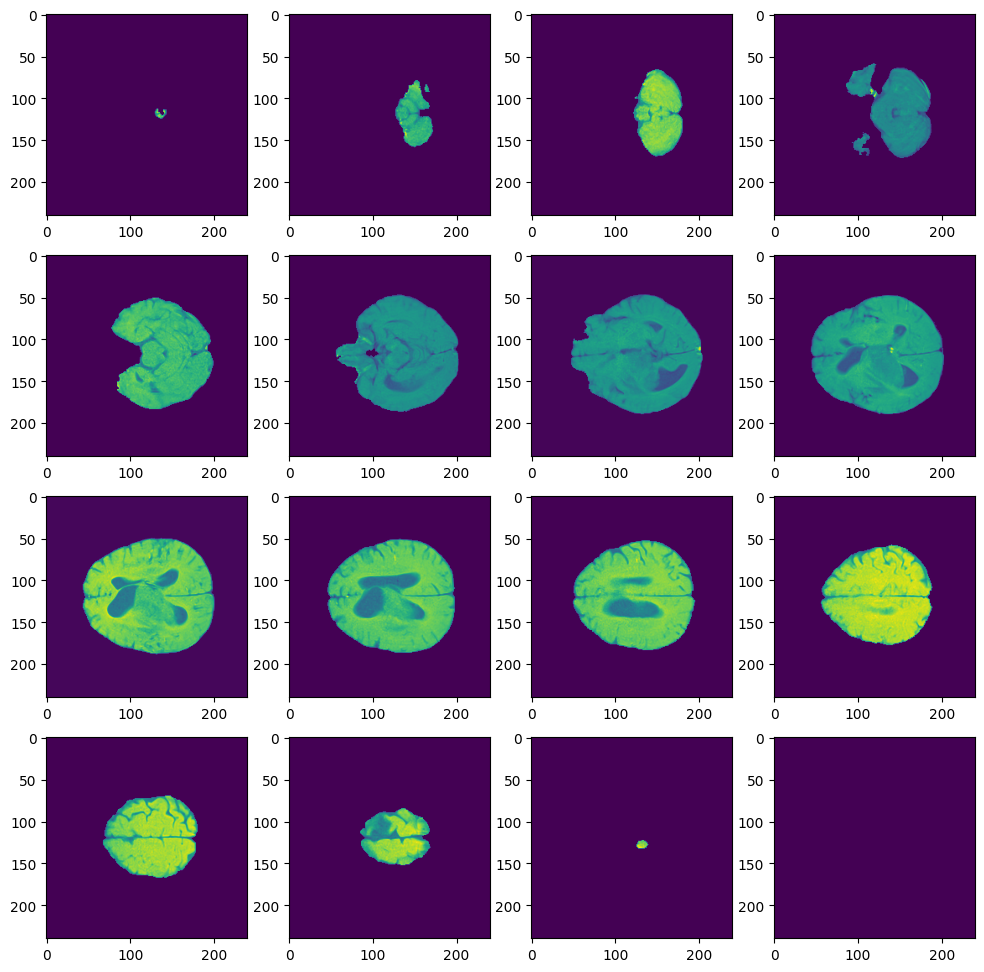

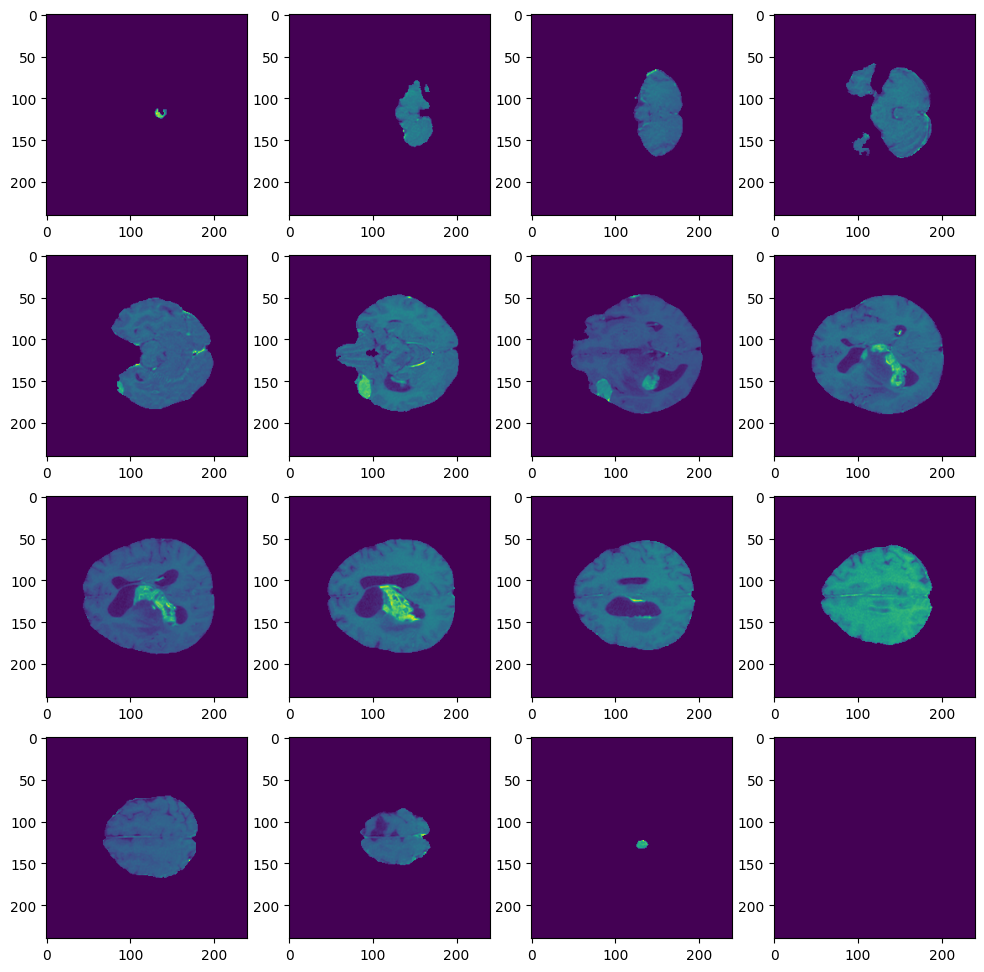

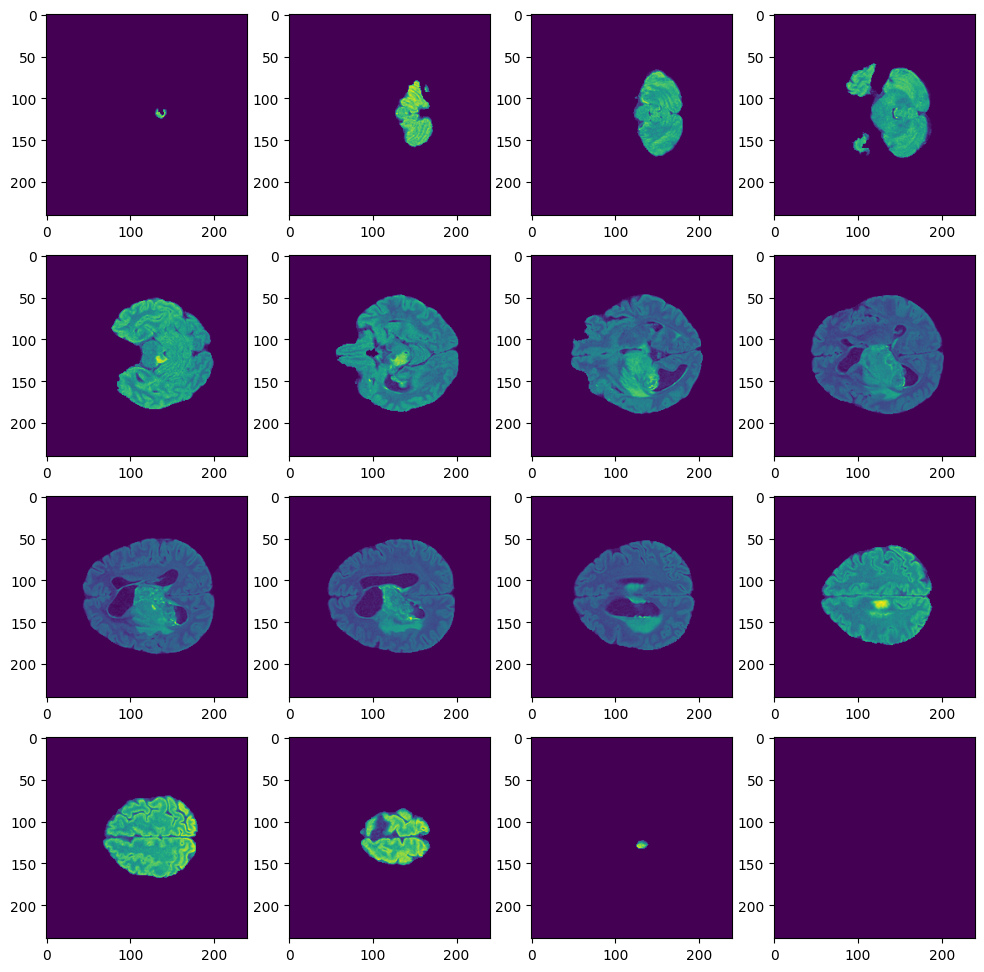

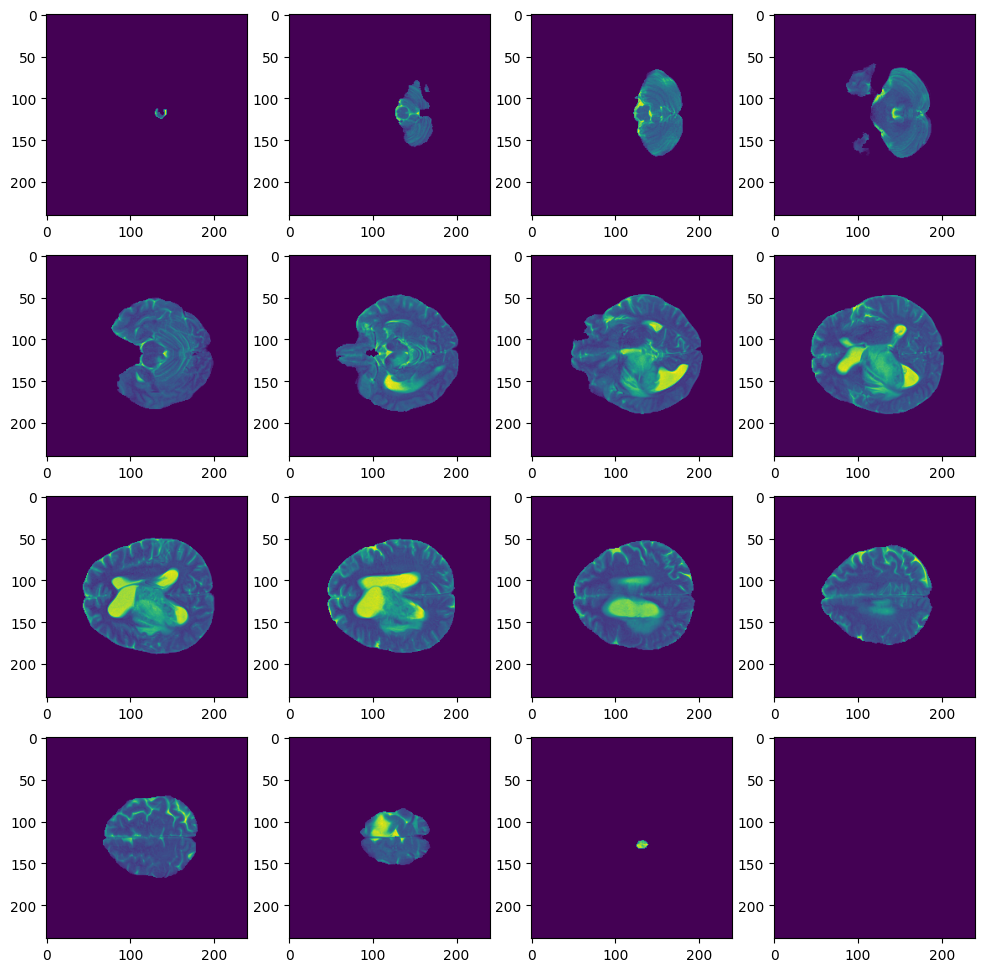

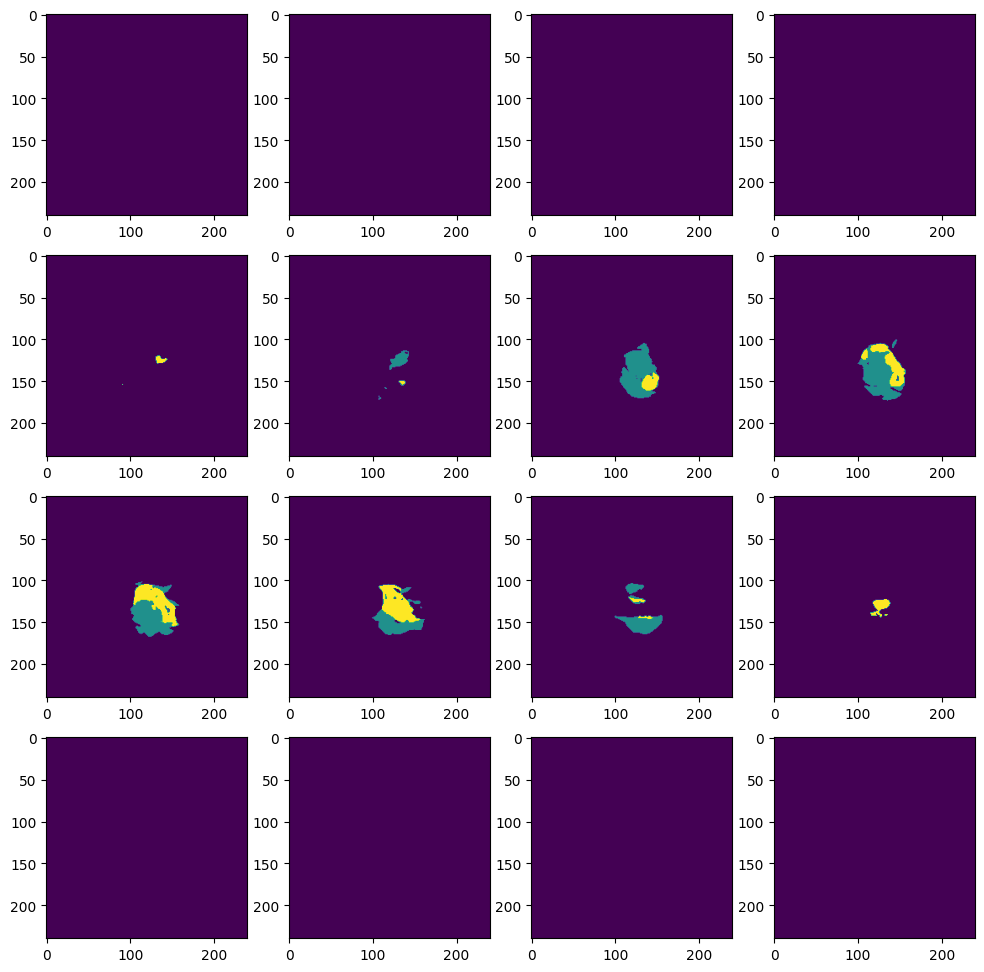

...

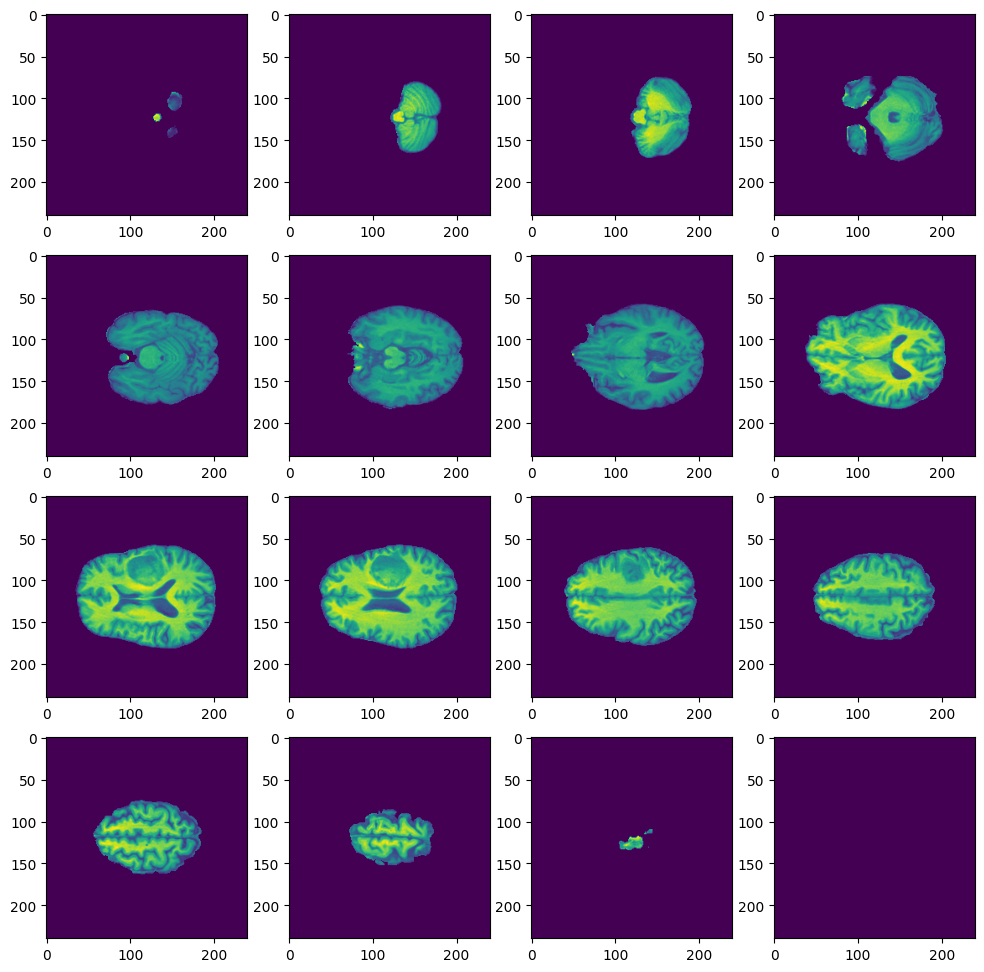

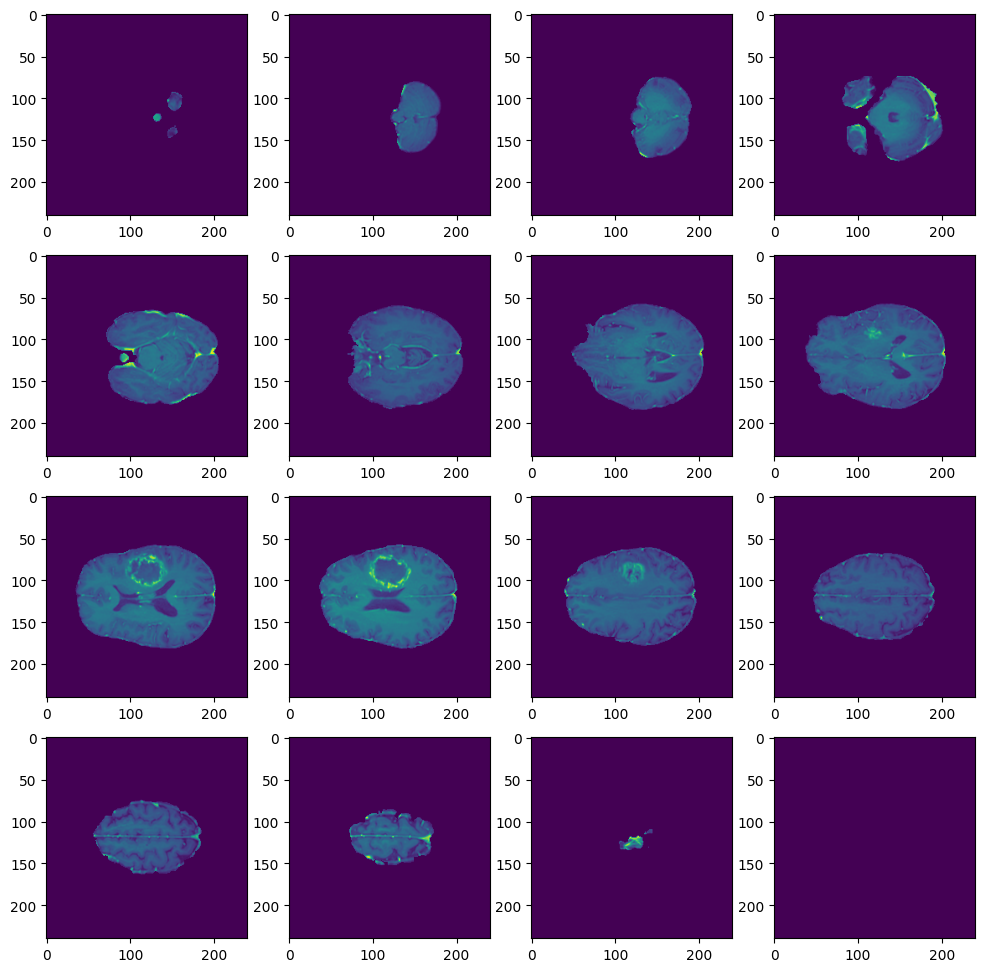

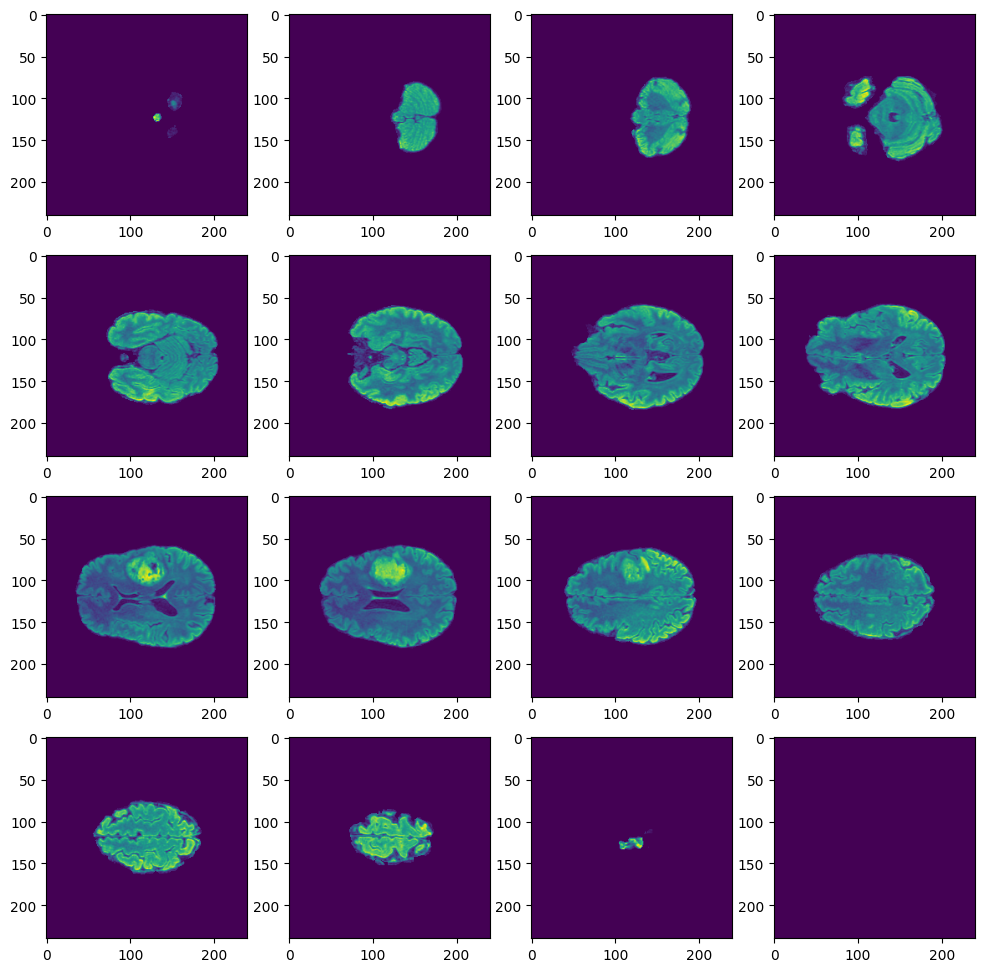

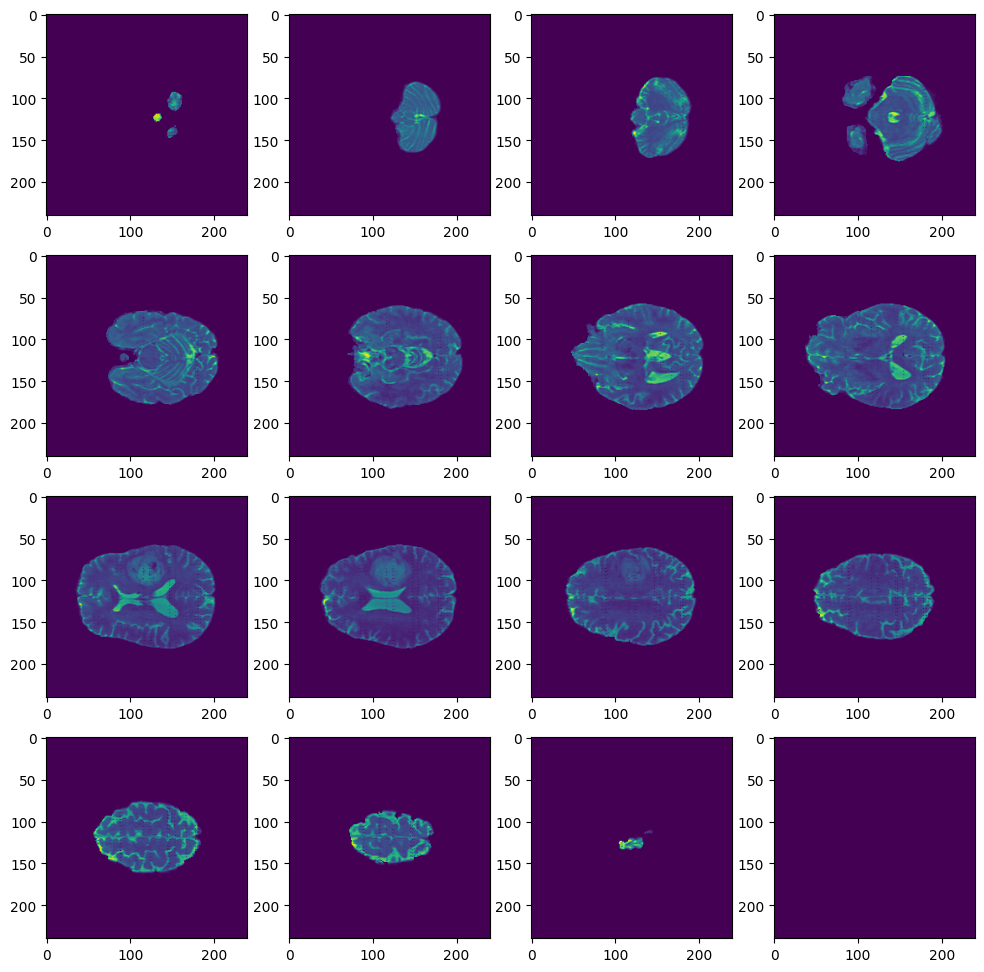

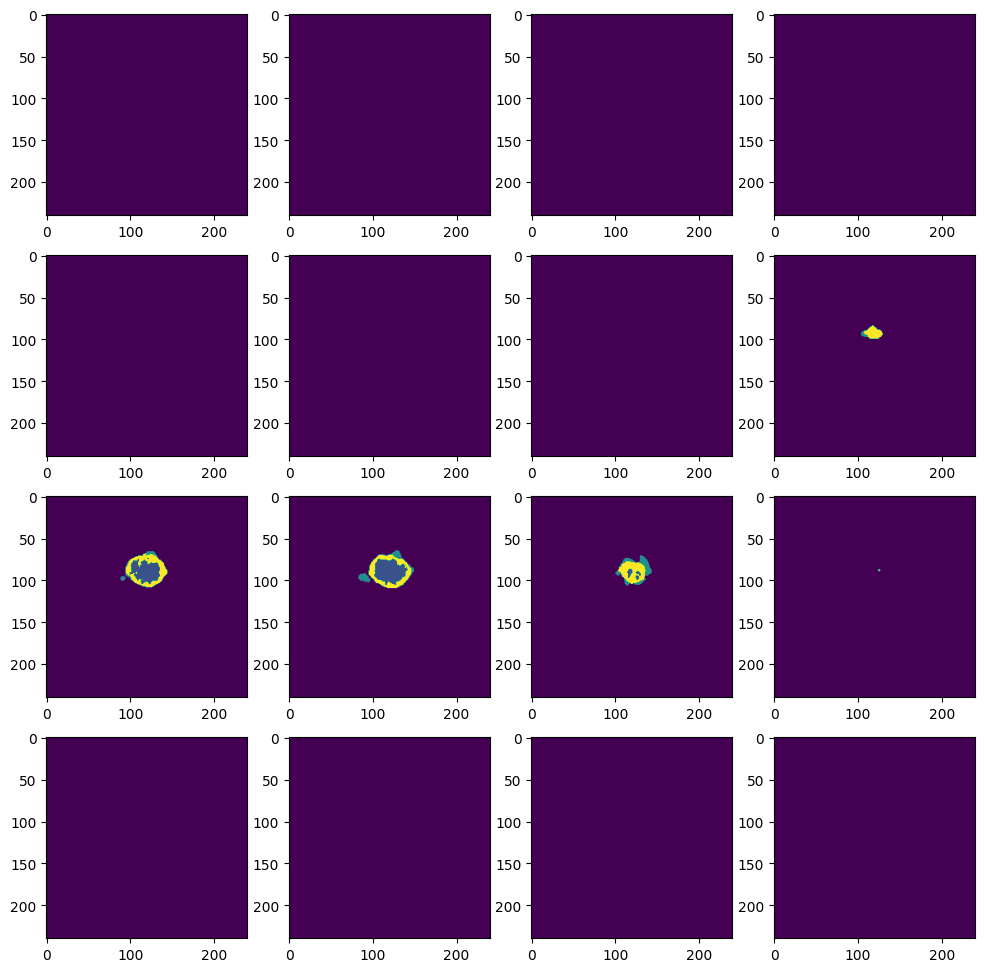

In [154]:
for i, scan in enumerate(unique_neg_scans):
    for j, scan_type in enumerate(scan_types):
        img = nib.load(main_path + scan + "/" + scan + '_' + scan_type + '.nii.gz').get_fdata()
        
        plt.style.use('default')
        fig, axes = plt.subplots(4,4, figsize=(12,12))
        for i, ax in enumerate(axes.reshape(-1)):
            ax.imshow(img[:,:,1 + i * 10])
        plt.show()

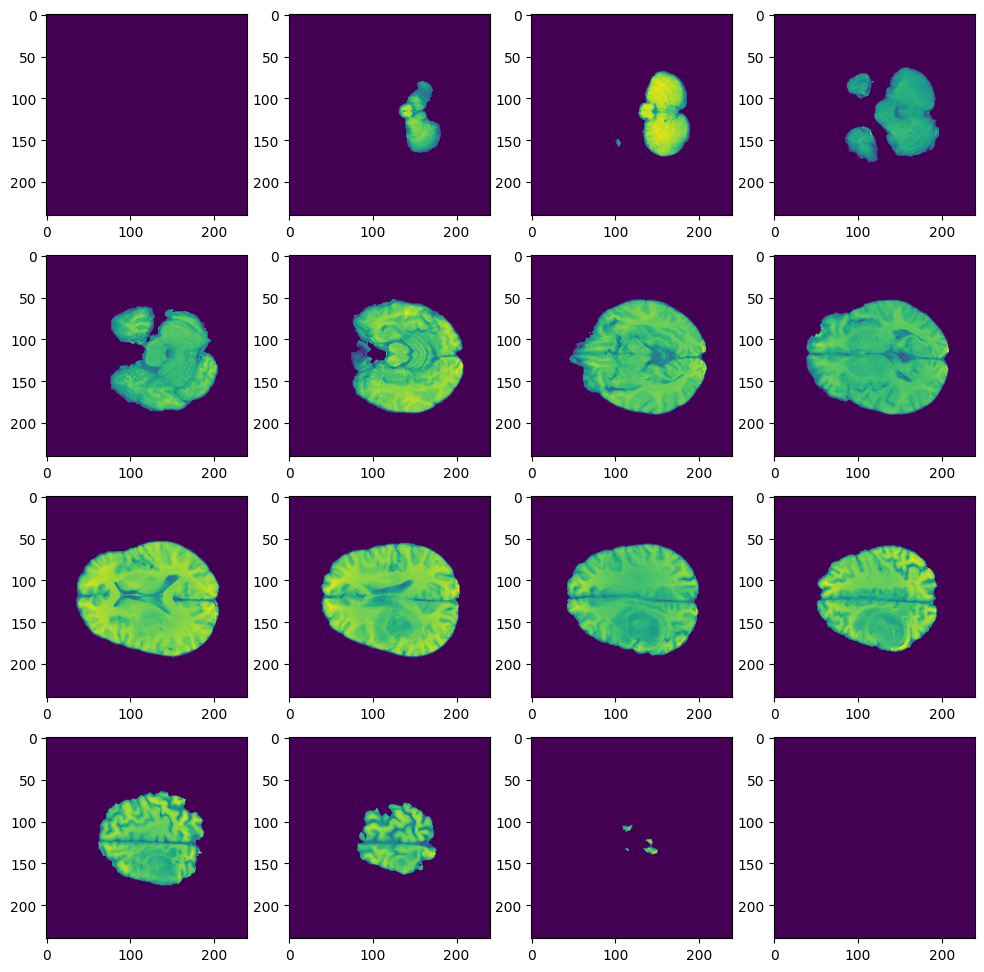

In [127]:
#The values for min and max are ( -162.0 150107.859375 ).
#The min scan is  BraTS2021_00446
scan_neg_min = "BraTS2021_00446"
img_neg_min = nib.load(main_path + scan_neg_min + "/" + scan_neg_min + '_t1.nii.gz').get_fdata()
np.min(img_neg_min)



plt.style.use('default')
fig, axes = plt.subplots(4,4, figsize=(12,12))
for i, ax in enumerate(axes.reshape(-1)):
    ax.imshow(img[:,:,1 + i * 10])
plt.show()

(240, 240, 155) 2876.0 0.0


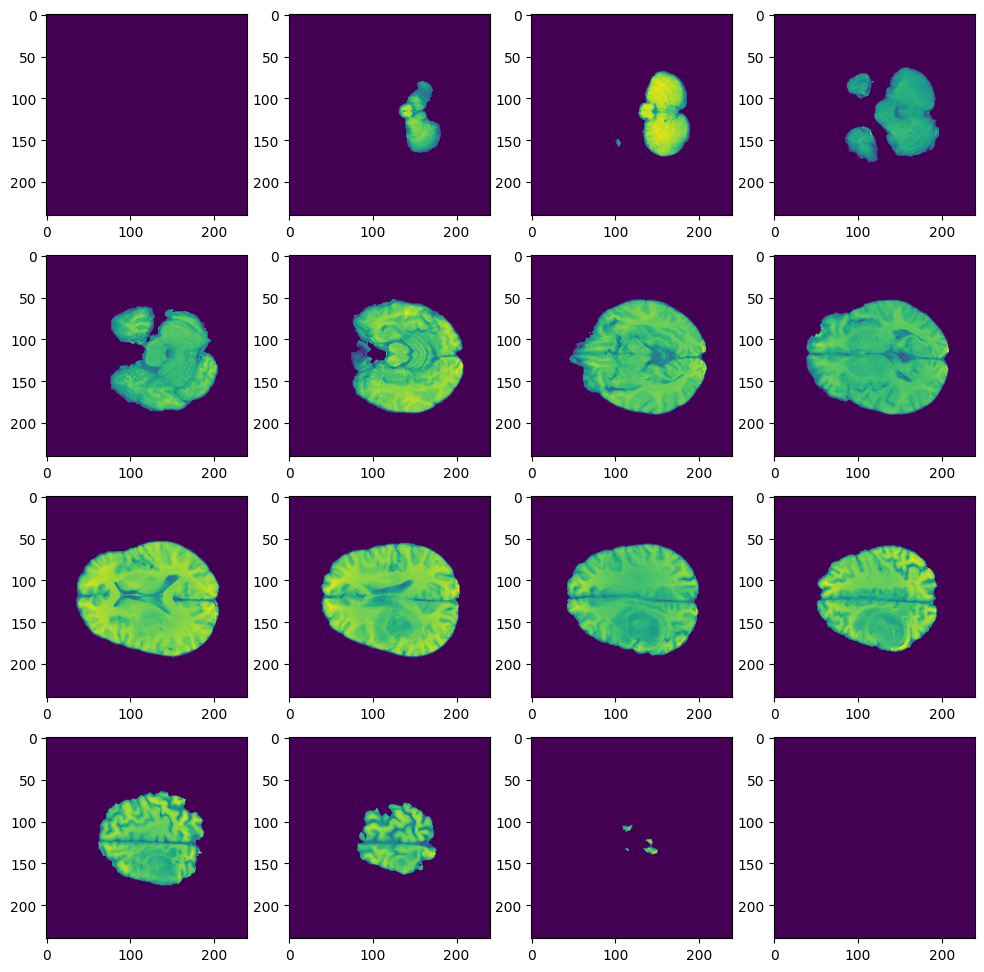

In [128]:
scan_neg_min_seg = nib.load(main_path + scan_neg_min + "/" + scan_neg_min + '_seg.nii.gz').get_fdata()
print(img.shape, np.max(img), np.min(img))
plt.style.use('default')
fig, axes = plt.subplots(4,4, figsize=(12,12))
for i, ax in enumerate(axes.reshape(-1)):
    ax.imshow(img[:,:,1 + i * 10])
plt.show()